# Superstore Marketing Campaign Dataset Analysis

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## About this file
Link to the dataset: https://www.kaggle.com/datasets/ahsan81/superstore-marketing-campaign-dataset

This data was gathered during last year's campaign.

- Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise
- ID - Unique ID of each customer
- Year_Birth - Age of the customer
- Complain - 1 if the customer complained in the last 2 years
- Dt_Customer - date of customer's enrollment with the company
- Education - customer's level of education
- Marital - customer's marital status
- Kidhome - number of small children in customer's household
- Teenhome - number of teenagers in customer's household
- Income - customer's yearly household income
- MntFishProducts - the amount spent on fish products in the last 2 years
- MntMeatProducts - the amount spent on meat products in the last 2 years
- MntFruits - the amount spent on fruits products in the last 2 years
- MntSweetProducts - amount spent on sweet products in the last 2 years
- MntWines - the amount spent on wine products in the last 2 years
- MntGoldProds - the amount spent on gold products in the last 2 years
- NumDealsPurchases - number of purchases made with discount
- NumCatalogPurchases - number of purchases made using catalog (buying goods to be shipped through the mail)
- NumStorePurchases - number of purchases made directly in stores
- NumWebPurchases - number of purchases made through the company's website
- NumWebVisitsMonth - number of visits to company's website in the last month
- Recency - number of days since the last purchase

## 0. Data Collection

In [2]:
data = pd.read_csv('superstore_data.csv')

## 1. Data Understanding
* Data's structure `.head()` and `.tail()`
* Types with `.info()`
* Summary statistics `.describe()`


In [3]:
data.shape

(2240, 22)

In [4]:
data.head()

,Id,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
0,1826,1970,Graduation,Divorced,84835.0,0,0,6/16/2014,0,189,...,111,189,218,1,4,4,6,1,1,0
1,1,1961,Graduation,Single,57091.0,0,0,6/15/2014,0,464,...,7,0,37,1,7,3,7,5,1,0
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/2014,0,134,...,15,2,30,1,3,2,5,2,0,0
3,1386,1967,Graduation,Together,32474.0,1,1,11/5/2014,0,10,...,0,0,0,1,1,0,2,7,0,0
4,5371,1989,Graduation,Single,21474.0,1,0,8/4/2014,0,6,...,11,0,34,2,3,1,2,7,1,0


In [5]:
data.tail()

,Id,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
2235,10142,1976,PhD,Divorced,66476.0,0,1,7/3/2013,99,372,...,47,48,78,2,5,2,11,4,0,0
2236,5263,1977,2n Cycle,Married,31056.0,1,0,1/22/2013,99,5,...,3,8,16,1,1,0,3,8,0,0
2237,22,1976,Graduation,Divorced,46310.0,1,0,3/12/2012,99,185,...,15,5,14,2,6,1,5,8,0,0
2238,528,1978,Graduation,Married,65819.0,0,0,11/29/2012,99,267,...,149,165,63,1,5,4,10,3,0,0
2239,4070,1969,PhD,Married,94871.0,0,2,1/9/2012,99,169,...,188,0,144,1,8,5,4,7,1,0


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Id                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

We can see that we dont have a lot of missing values in the dataset. We are also lucky as we have a full description of the columns in the dataset. However, in real world scenarios, we dont have this luxury. So it is very important to understand the data and the columns in the dataset and  ask the right questions to the stakeholders to get a better understanding of the data.


In [7]:
data.describe()

,Id,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.149107,0.009375
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.356274,0.096391
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000


In [8]:
data_categorical = data.select_dtypes(include=['object'])
data_categorical.describe()

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,8/31/2012
freq,1127,864,12


## 2. Data Cleaning
* Handling missing values: `.isnull().sum()` and `.fillna()` or `.dropna()`
* Removing duplicates: `.drop_duplicates()`

*Handling missing values: `.isnull().sum()` and `.fillna()` or `.dropna()`*

In [9]:
data.isnull().sum()

Id                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
Response                0
Complain                0
dtype: int64

In [10]:
data[data['Income'].isnull()]

,Id,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
134,8996,1957,PhD,Married,NaN,2,1,11/19/2012,4,230,...,49,37,53,12,7,2,8,9,0,0
262,1994,1983,Graduation,Married,NaN,1,0,11/15/2013,11,5,...,0,2,1,1,1,0,2,7,0,0
394,3769,1972,PhD,Together,NaN,1,0,2/3/2014,17,25,...,0,0,3,1,1,0,3,7,0,0
449,5255,1986,Graduation,Single,NaN,1,0,2/20/2013,19,5,...,3,263,362,0,27,0,0,1,0,0
525,8268,1961,PhD,Married,NaN,0,1,11/7/2013,23,352,...,10,0,15,3,6,1,7,6,0,0
590,10629,1973,2n Cycle,Married,NaN,1,0,9/14/2012,25,25,...,17,4,17,3,3,0,3,8,0,0
899,10475,1970,Master,Together,NaN,0,1,1/4/2013,39,187,...,26,20,14,2,4,2,6,5,0,0
997,9235,1957,Graduation,Single,NaN,1,1,5/27/2014,45,7,...,2,0,1,1,1,0,2,7,0,0
1096,4345,1964,2n Cycle,Single,NaN,1,1,12/1/2014,49,5,...,2,0,4,1,1,0,2,7,0,0
1185,7187,1969,Master,Together,NaN,1,1,5/18/2013,52,375,...,94,66,96,7,4,10,4,3,0,0


<Axes: title={'center': 'Income Box Plot'}>

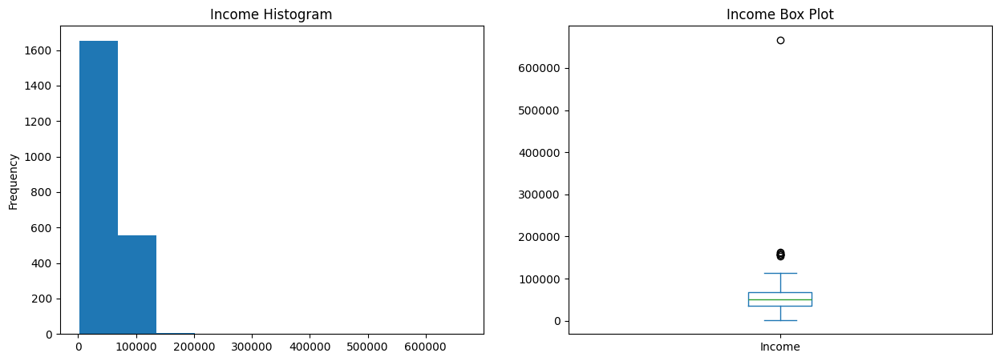

In [11]:
fig, axes = plt.subplots(1,2, figsize=(15, 5)) 
data['Income'].plot(kind='hist', ax=axes[0], title='Income Histogram')
data['Income'].plot(kind='box', ax=axes[1], title='Income Box Plot')

In [12]:
data['Income'].describe()

count      2216.000000
mean      52247.251354
std       25173.076661
min        1730.000000
25%       35303.000000
50%       51381.500000
75%       68522.000000
max      666666.000000
Name: Income, dtype: float64

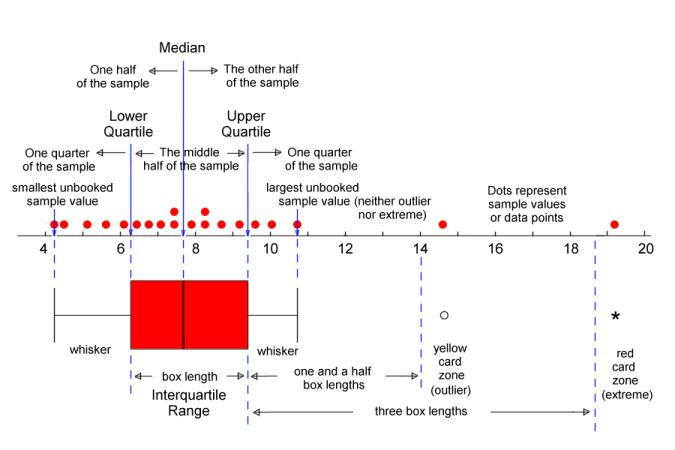

<Axes: title={'center': 'Income Box Plot'}>

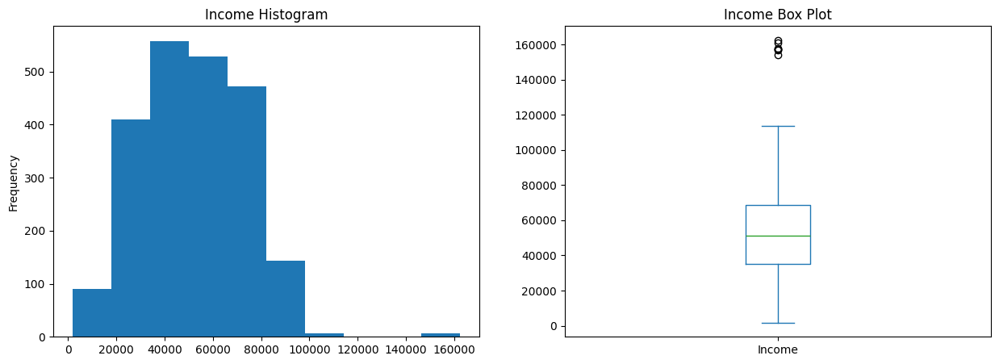

In [13]:
fig, axes = plt.subplots(1,2, figsize=(15, 5)) 
data[data['Income'] < data['Income'].max()]['Income'].plot(kind='hist', ax=axes[0], title='Income Histogram')
data[data['Income'] < data['Income'].max()]['Income'].plot(kind='box', ax=axes[1], title='Income Box Plot')

In [14]:
data[data['Income'] < data['Income'].max()]['Income'].describe()

count      2215.000000
mean      51969.861400
std       21526.320095
min        1730.000000
25%       35284.000000
50%       51373.000000
75%       68487.000000
max      162397.000000
Name: Income, dtype: float64

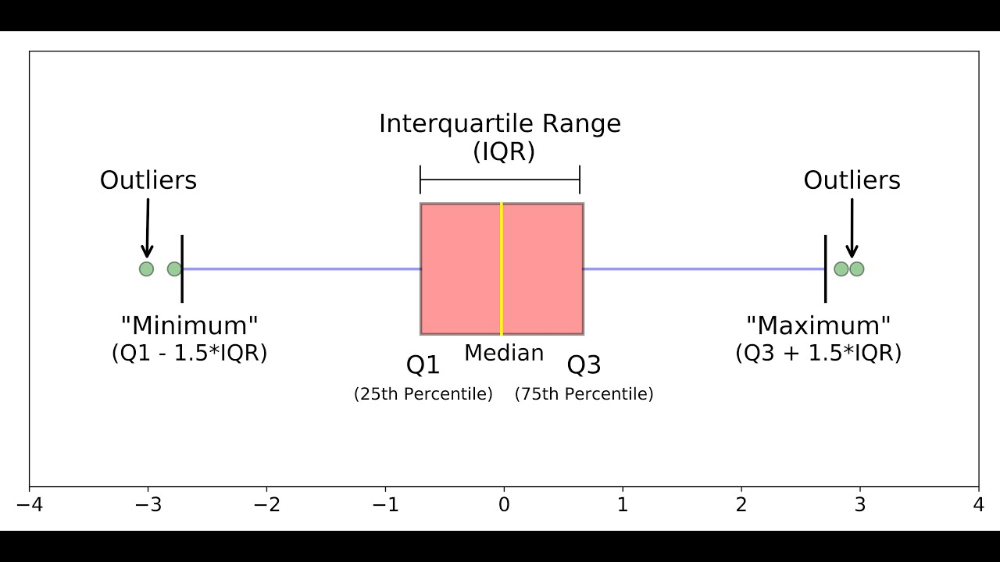

In [15]:
Q1 = data['Income'].quantile(0.25)
Q3 = data['Income'].quantile(0.75)
IQR = Q3 - Q1  
upper_bound = Q3 + 1.5 * IQR

<Axes: title={'center': 'Income Box Plot'}>

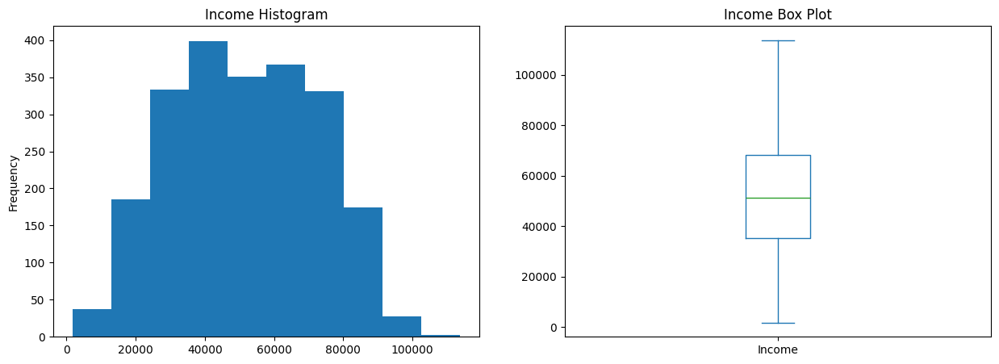

In [16]:
fig, axes = plt.subplots(1,2, figsize=(15, 5)) 
data[data['Income'] <= upper_bound]['Income'].plot(kind='hist', ax=axes[0], title='Income Histogram')
data[data['Income'] <= upper_bound]['Income'].plot(kind='box', ax=axes[1], title='Income Box Plot')

In [17]:
data[data['Income'] <= upper_bound]['Income'].describe()

count      2208.000000
mean      51633.638134
std       20713.376530
min        1730.000000
25%       35196.000000
50%       51301.000000
75%       68289.750000
max      113734.000000
Name: Income, dtype: float64

*`.fillna()`*

In [18]:
data['Income'] = data['Income'].fillna(data['Income'].mean())

*Checking for duplicates: `.duplicated().sum()`*

In [19]:
data.duplicated().sum()

0

We dont have any duplicates in the dataset. However, if we had duplicates, we would have removed them using the following code:

`data = data.drop_duplicates()`

*Selecting columns: `df[['column1', 'column2']]`*

In [20]:
data.columns

Index(['Id', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Response', 'Complain'],
      dtype='object')

For the moment I think it is better to keep all the columns in the dataset. Later on we can drop the columns which are not useful for the model (depending on the what the model is trying to predict).

## 3. Univariate Analysis
* Distribution of numerical features: `.hist()` or `.plot(kind='box')`
* Categorical feature counts: `.value_counts()`
* Outlier detection: `.boxplot()` and `.quantile()`
* Boxplot: for categorical variables

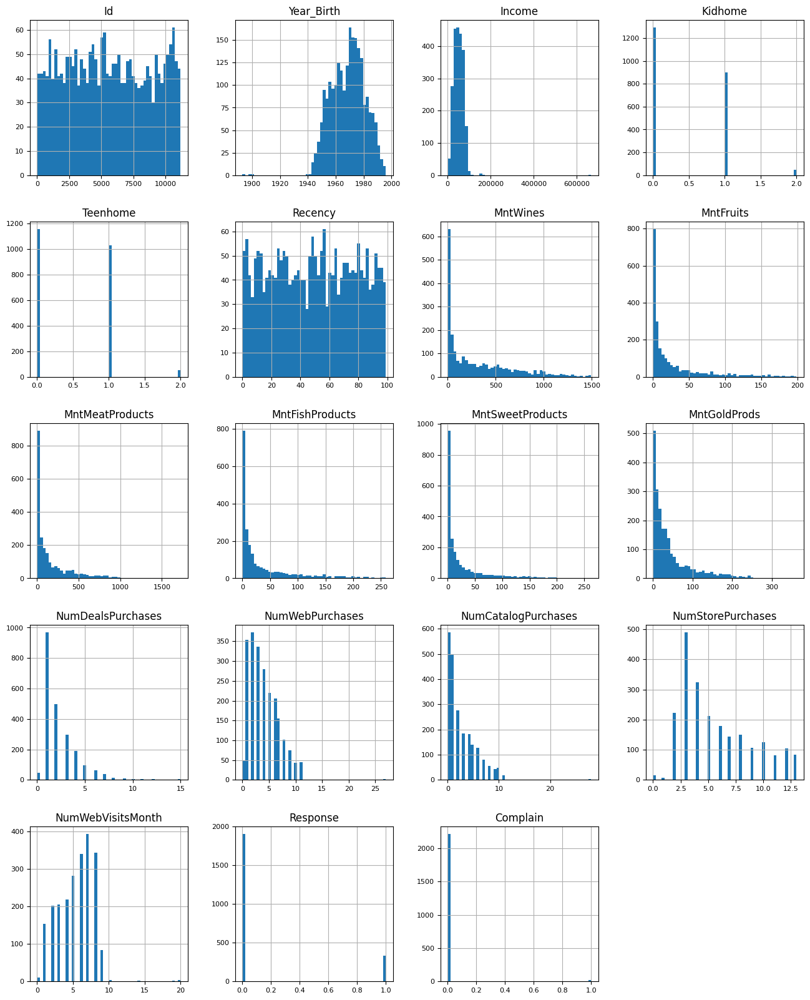

In [21]:
data.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8)
plt.show()

In [22]:
data_categorical.describe()

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,8/31/2012
freq,1127,864,12


In [23]:
data['Id'].nunique() == data.shape[0]

True

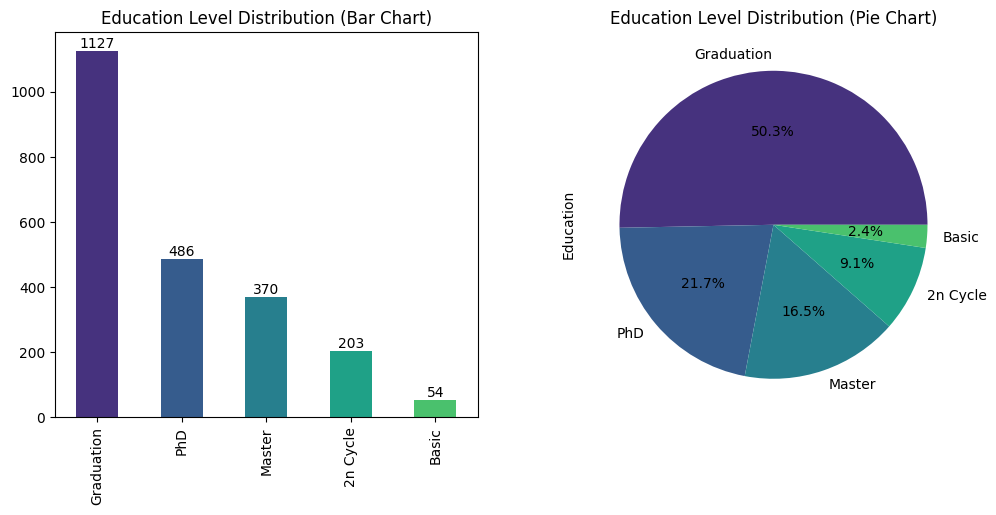

In [24]:
fig, axes = plt.subplots(1,2, figsize=(12, 5))

colors = sns.color_palette('viridis')[0:data['Education'].nunique()]

data['Education'].value_counts().plot(
    kind='bar',
    ax=axes[0],
    color=colors,)

data['Education'].value_counts().plot(
    kind='pie',
    ax=axes[1],
    autopct='%1.1f%%',
    colors=colors) 

axes[0].set_title('Education Level Distribution (Bar Chart)')
axes[1].set_title('Education Level Distribution (Pie Chart)')

bar_labels = data['Education'].value_counts().values
for i, bar_label in enumerate(bar_labels):
    axes[0].text(i, bar_label, bar_label, ha='center', va='bottom')

plt.show()

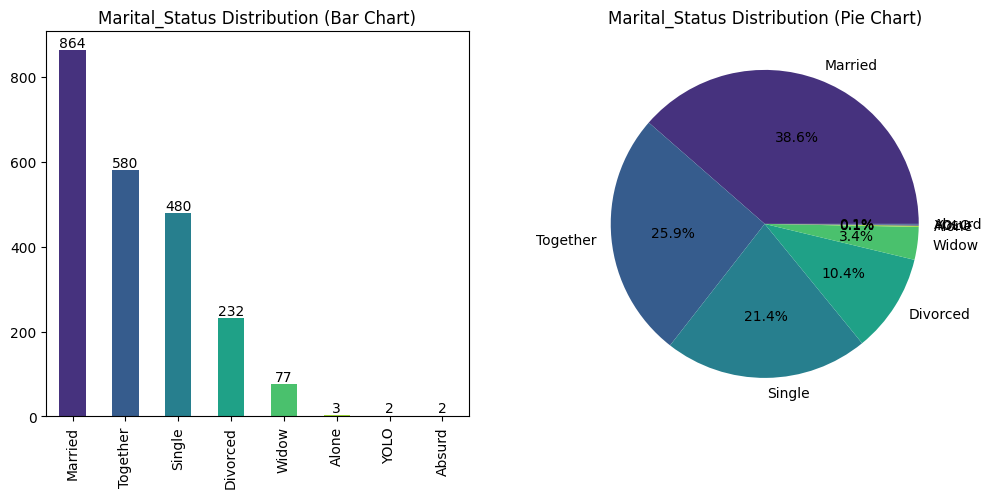

In [25]:
fig, axes = plt.subplots(1,2, figsize=(12, 5))


colors = sns.color_palette('viridis')[0:data['Marital_Status'].nunique()]

data['Marital_Status'].value_counts().plot(
    kind='bar',
    ax=axes[0], 
    color = colors)
data['Marital_Status'].value_counts().plot(
    kind='pie',
    ax=axes[1],
    autopct='%1.1f%%',
    colors=colors)

axes[0].set_title('Marital_Status Distribution (Bar Chart)')
axes[1].set_title('Marital_Status Distribution (Pie Chart)')
axes[1].set_ylabel('')

bar_labels = data['Marital_Status'].value_counts().values
for i, bar_label in enumerate(bar_labels):
    axes[0].text(i, bar_label, bar_label, ha='center', va='bottom')

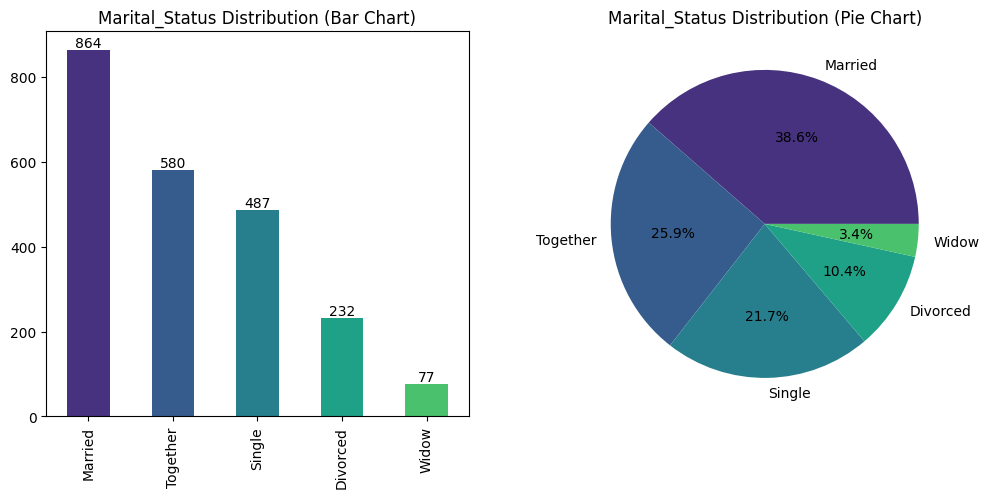

In [26]:
data['Marital_Status'] = data['Marital_Status'].apply(
    lambda x: "Single" if x in ["YOLO", "Absurd", "Alone"] else x
)
fig, axes = plt.subplots(1,2, figsize=(12, 5))

colors = sns.color_palette('viridis')[0:data['Marital_Status'].nunique()]

data['Marital_Status'].value_counts().plot(
    kind='bar',
    ax=axes[0], 
    color = colors)
data['Marital_Status'].value_counts().plot(
    kind='pie',
    ax=axes[1],
    autopct='%1.1f%%',
    colors=colors)

axes[0].set_title('Marital_Status Distribution (Bar Chart)')
axes[1].set_title('Marital_Status Distribution (Pie Chart)')
axes[1].set_ylabel('')

bar_labels = data['Marital_Status'].value_counts().values
for i, bar_label in enumerate(bar_labels):
    axes[0].text(i, bar_label, bar_label, ha='center', va='bottom')

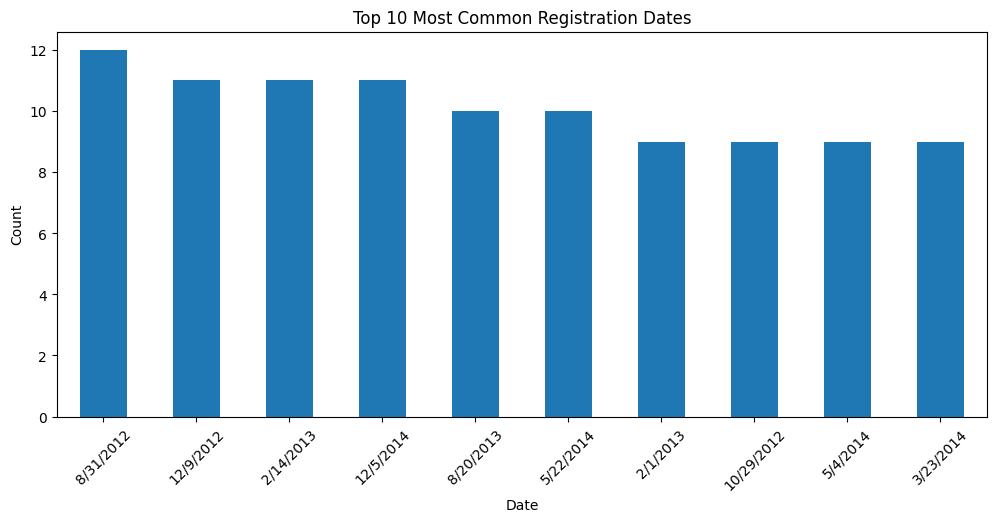

In [27]:
data['Dt_Customer'].value_counts() \
    .iloc[:10] \
    .plot(
        kind='bar',
        figsize=(12, 5),
        title='Top 10 Most Common Registration Dates',
        ylabel='Count',
        xlabel='Date',
    )
plt.xticks(rotation=45)
plt.show()

What would be interesting to see is the distribution by months or years so we can find out the seasonality in the data. Later lets add this to the data. 

## 4. Bivariate/Multivariate Analysis
* Correlation between features: `.corr()`
* Visualizing relationships: `sns.pairplot()` for pairs, `sns.heatmap()` for correlation matrix

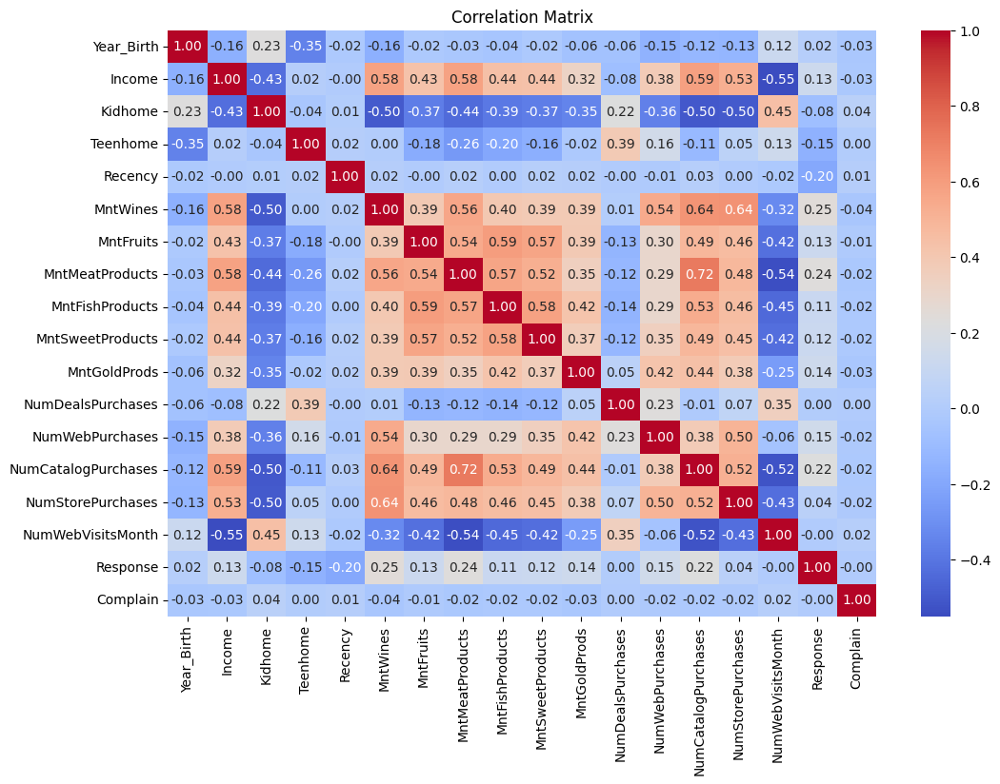

In [28]:
data_numerical = data.select_dtypes(include=['int64', 'float64']).drop(columns=['Id'])
data_corr = data_numerical.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(data_corr, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

In [29]:
columns = data_numerical.columns
columns = [
    'Year_Birth',
    'Income',
    # 'Kidhome',
    # 'Teenhome',
    'Recency',
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    # 'NumDealsPurchases',
    # 'NumWebPurchases',
    # 'NumCatalogPurchases',
    # 'NumStorePurchases',
    # 'NumWebVisitsMonth',
    'Response',
    # 'Complain'
]

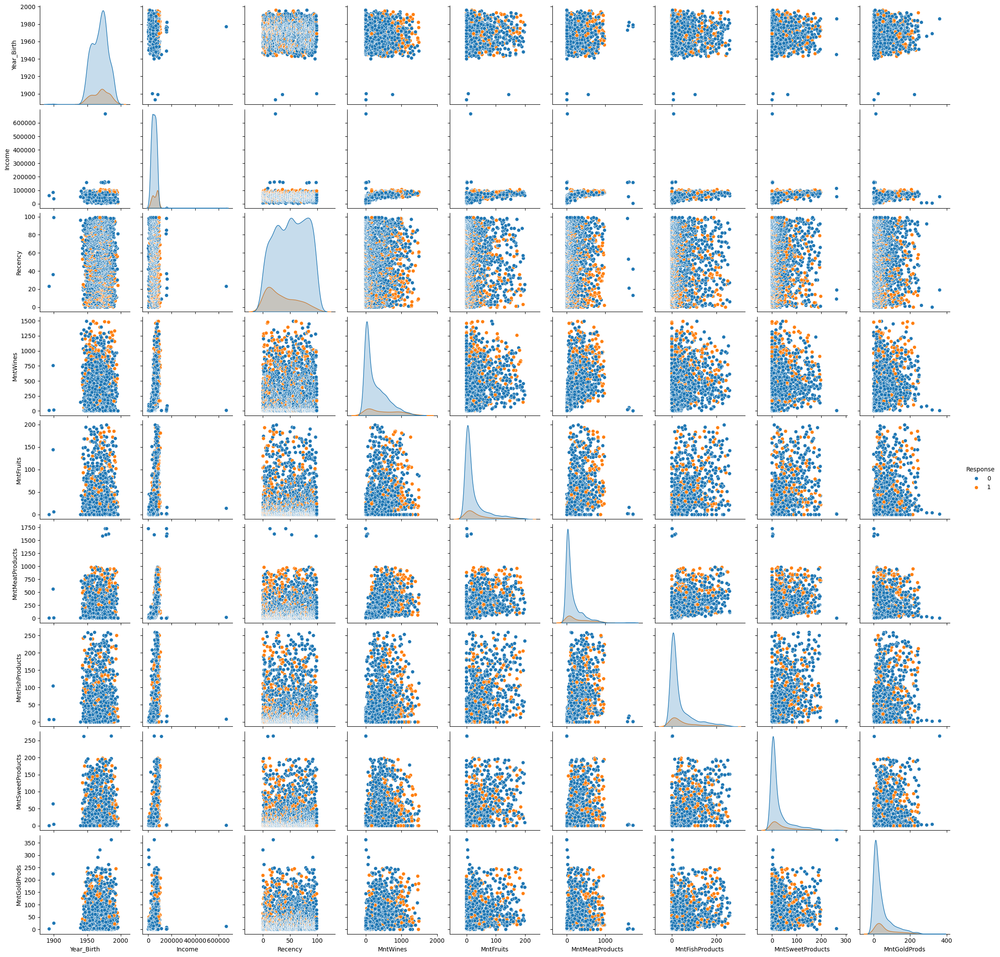

In [30]:
sns.pairplot(data=data[columns], diag_kind='kde', hue='Response')

In [31]:
def remove_outliers(data, column, upper_percentile:None=0.75):
    lower_percentile = 1 - upper_percentile
    Q1 = data[column].quantile(lower_percentile)
    Q3 = data[column].quantile(upper_percentile)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR

    print(column,
          "found outliers:",
          data[(data[column] > upper_bound) | (data[column] < lower_bound)].shape[0])
    return data[(data[column] <= upper_bound) & (data[column] >= lower_bound)]

data_cleaned = data.copy()
for column in data[columns].drop(["Response"], axis =1).columns:
    data_cleaned = remove_outliers(data_cleaned, column, upper_percentile=0.85)

data_cleaned.shape, data.shape

Year_Birth found outliers: 3
Income found outliers: 8
Recency found outliers: 0
MntWines found outliers: 0
MntFruits found outliers: 53
MntMeatProducts found outliers: 9
MntFishProducts found outliers: 43
MntSweetProducts found outliers: 70
MntGoldProds found outliers: 27


((2027, 22), (2240, 22))

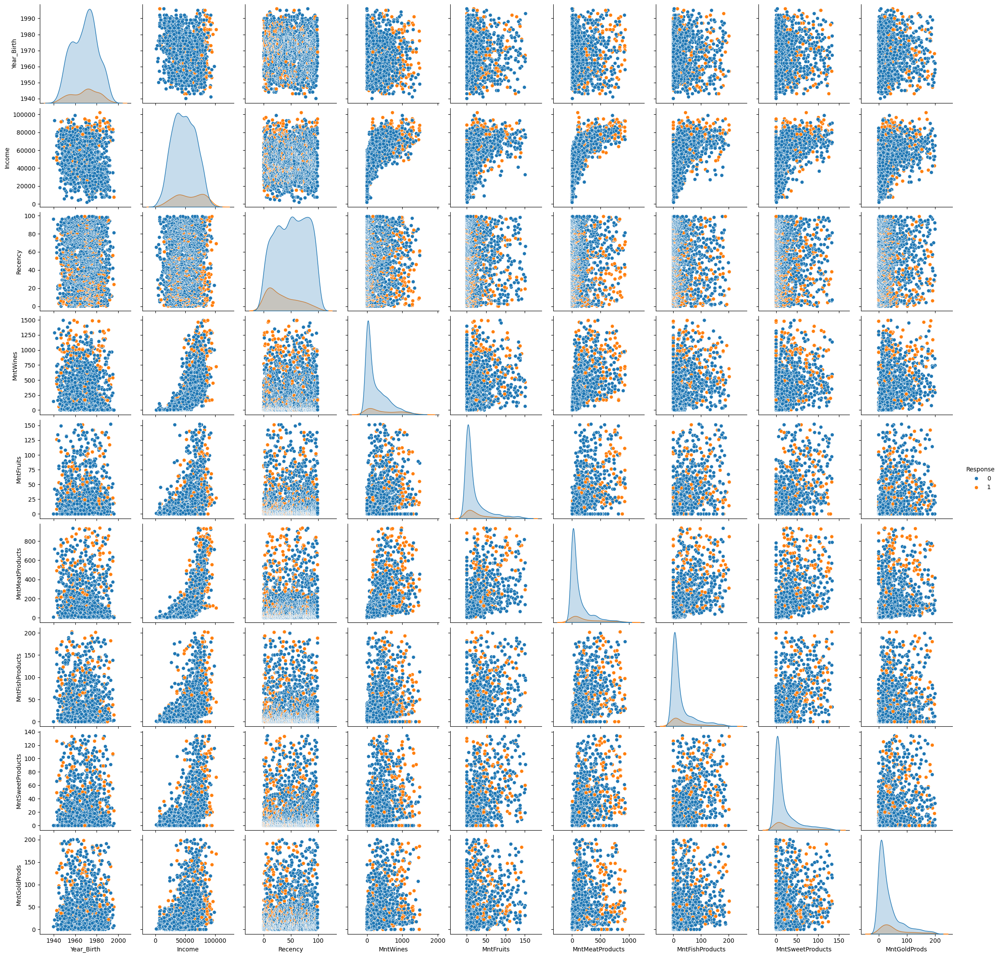

In [32]:
sns.pairplot(data=data_cleaned[columns], diag_kind='kde', hue='Response')

## 5. Feature Engineering
* Creating new features: Combining or transforming existing features
* Encoding categorical variables: `.get_dummies()` or `LabelEncoder`

As it was said earlier it would be interesting to see the seasonality in the data. So we can create new features called `Month`, `Year` and `Day` from the `Dt_Customer` column.

In [33]:
data_cleaned['month'] = pd.to_datetime(data_cleaned['Dt_Customer']).dt.month
data_cleaned['year'] = pd.to_datetime(data_cleaned['Dt_Customer']).dt.year
data_cleaned['day'] = pd.to_datetime(data_cleaned['Dt_Customer']).dt.day

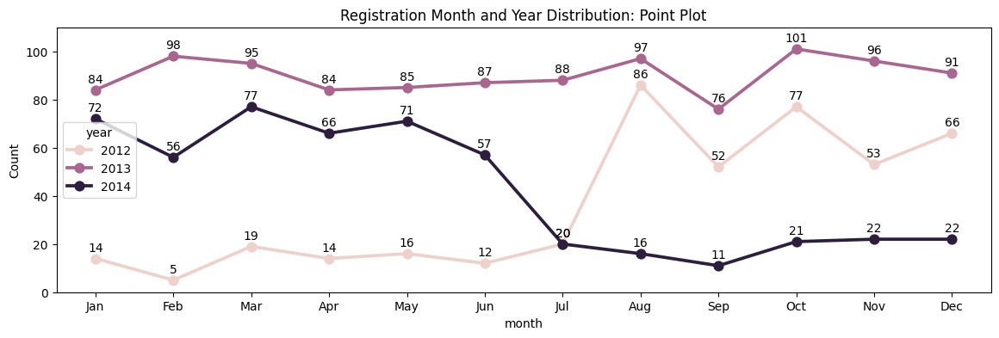

In [34]:
plt.figure(figsize=(14, 4))
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

ax = sns.pointplot(
    data=data_cleaned.groupby(['year','month'])['Id'].count().reset_index(),
    x='month',
    y='Id',
    hue='year'
)

ax.set_xticks(range(12))
ax.set_xticklabels(labels=months)
ax.set_ylabel('Count')

for line in ax.get_lines():
    x_data = line.get_xdata()
    y_data = line.get_ydata()
    
    if not all(pd.isna(y_data)):
        for x, y in zip(x_data, y_data):
            if not pd.isna(y):
                ax.text(x, y+2, f'{int(y)}', ha='center', va='bottom', fontsize=10)

plt.ylim(0, 110)
plt.title('Registration Month and Year Distribution: Point Plot')
plt.show()

* `2012:` We can see that the year 2012 in the beginning had low number of new customers but as the year progressed the number of new customers increased.
* `2013:` In 2013, the number of new customers was high throughout the year comared to other years.
* `2014:` In 2014, the number of new customers was high in the beginning of the year and from July the number of new customers decreased.

As an additional note we can see that for all the years September shows a decrease. Meanwhile, the number of new customers in the month of October tends to increase.

We can plot the same data but in a slightly different way.

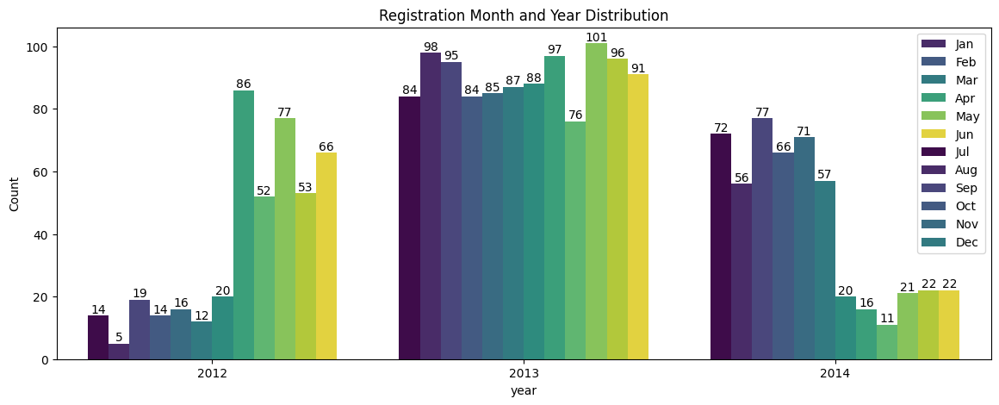

In [35]:
plt.figure(figsize=(14, 5))
ax = sns.countplot(data=data_cleaned, x='year', hue='month', palette='viridis')
for container in ax.containers:
    ax.bar_label(container)
plt.title('Registration Month and Year Distribution')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(months)
plt.show()

In [36]:
tmp = data_cleaned.groupby(['year', 'month', "Response"]).agg(
    Count = ("Id", "count")).reset_index()

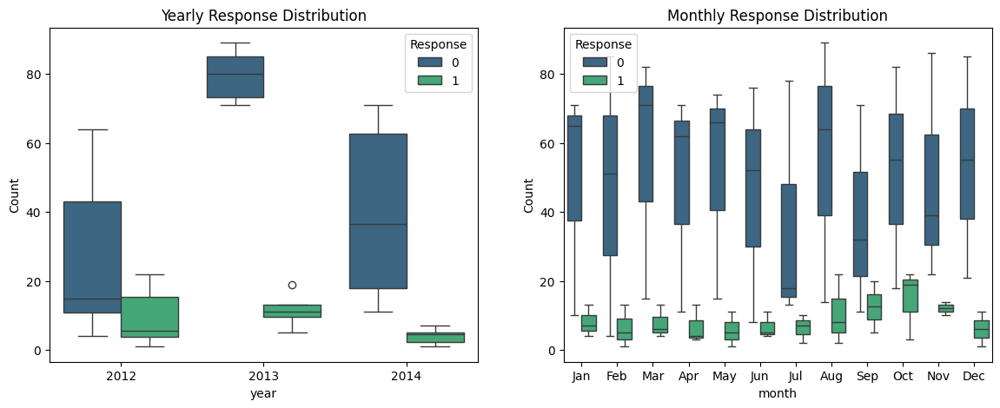

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.boxplot(data=tmp, x='year', y='Count', hue='Response', ax=axes[0], palette='viridis')
sns.boxplot(data=tmp, x='month', y='Count', hue='Response', ax=axes[1], palette='viridis')

axes[0].set_title('Yearly Response Distribution')
axes[1].set_title('Monthly Response Distribution')
axes[1].set_xticks(range(12))
axes[1].set_xticklabels(months)
plt.show()

## 6. Data Visualization based on questions

### 6.1. How does the number of children at home affect the amount spent on different products?

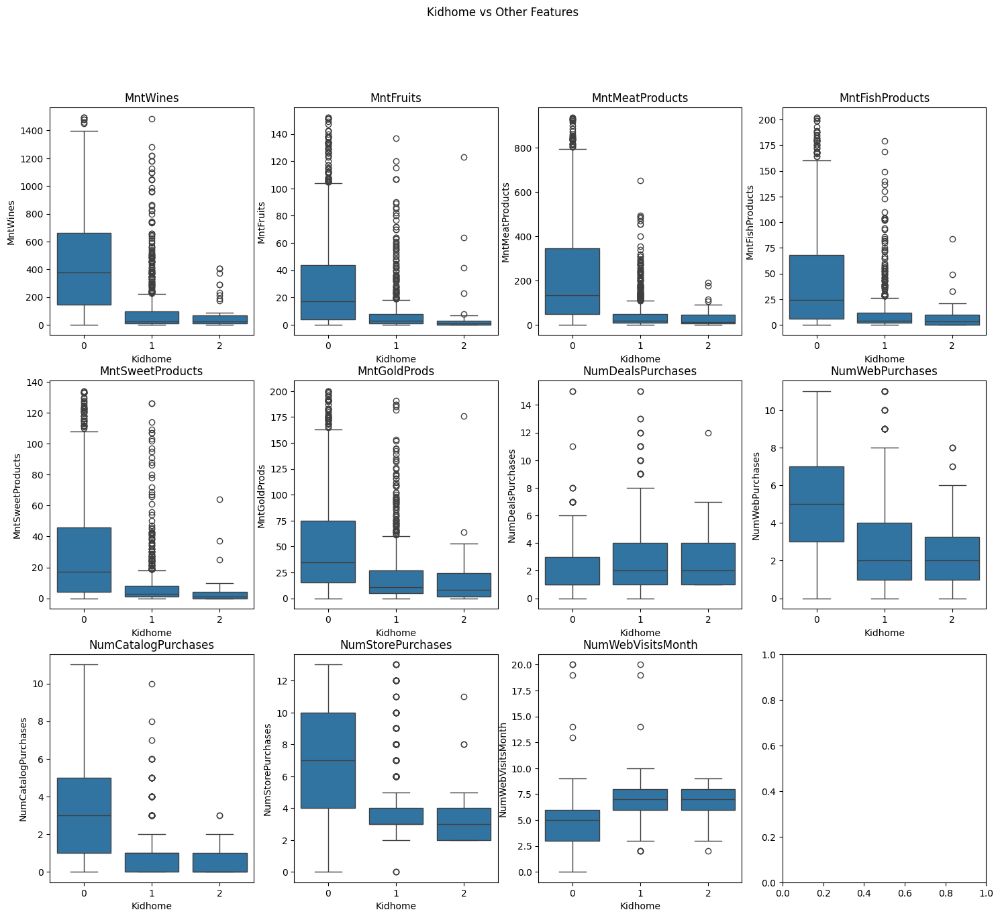

In [38]:
mnt_columns = [
    "Response",
    "Kidhome",
    'MntWines',
    'MntFruits',
    'MntMeatProducts',
    'MntFishProducts',
    'MntSweetProducts',
    'MntGoldProds',
    'NumDealsPurchases',
    'NumWebPurchases',
    'NumCatalogPurchases',
    'NumStorePurchases',
    'NumWebVisitsMonth',
]
fig, axes = plt.subplots(3, 4, figsize=(18, 15))
for i, column in enumerate(mnt_columns[2:]):
    sns.boxplot(data=data_cleaned, x='Kidhome', y=column, ax=axes[i//4, i%4],)
    axes[i//4, i%4].set_title(f'{column}')
plt.suptitle('Kidhome vs Other Features')
plt.show()

* We can see that people with 0 children spend more on different products compared to people with 1 or 2 children. 
* However, people with children spend more on when there is a discount (`NumDealsPurchases`) compared to people with no children. 
* We can also see that people with children tend to visit the website more compared to people with no children.

### 6.2. The distribution of the number of children at home


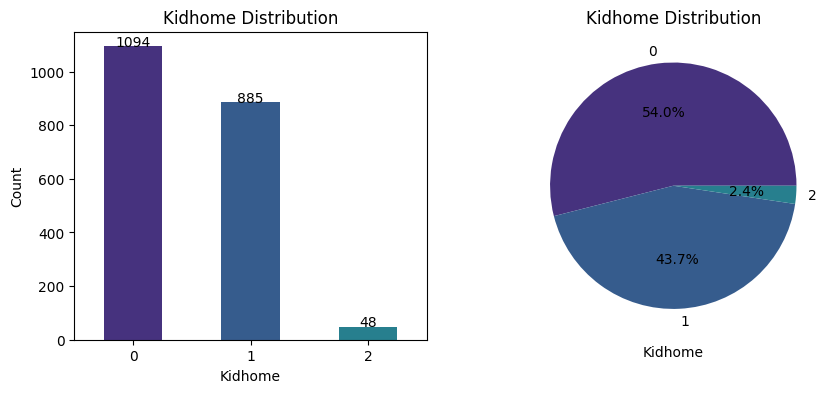

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
colors = sns.color_palette('viridis')[0:data['Kidhome'].nunique()]


data_cleaned['Kidhome'].value_counts().plot(kind='bar', figsize=(10, 4), title='Kidhome Distribution', ax=axes[0], color=colors)
data_cleaned['Kidhome'].value_counts().plot(kind='pie', autopct='%1.1f%%', title='Kidhome Distribution', ax=axes[1], colors=colors)

bar_labels = data_cleaned['Kidhome'].value_counts().values
for i, bar_label in enumerate(bar_labels):
    axes[0].text(i, bar_label, bar_label, ha='center', )

axes[0].set_xticks(ticks = range(data_cleaned['Kidhome'].nunique()), labels = data_cleaned['Kidhome'].unique(), rotation=0)
axes[0].set_ylabel('Count')
axes[1].set_ylabel('')
axes[0].set_xlabel('Kidhome')
axes[1].set_xlabel('Kidhome')

plt.show()

### 6.3. How does the marital status affect the amount spent on different products?

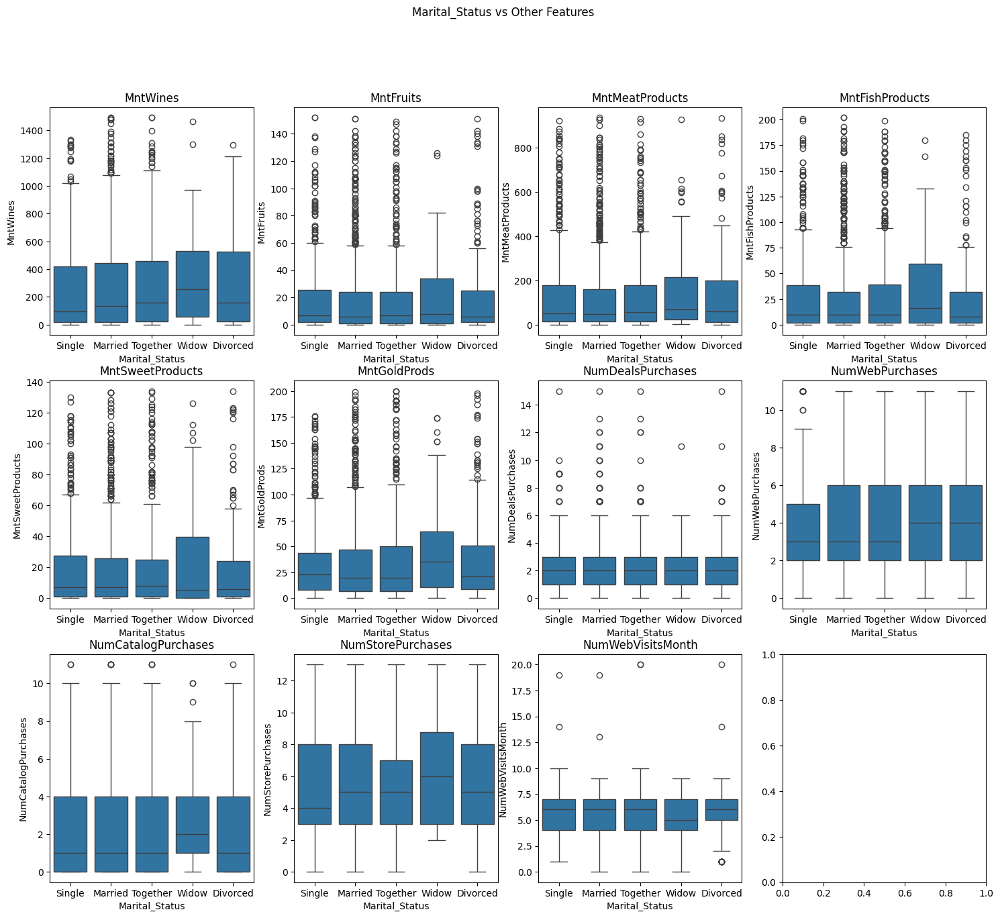

In [40]:
fig, axes = plt.subplots(3, 4, figsize=(18, 15))
for i, column in enumerate(mnt_columns[2:]):
    sns.boxplot(data=data_cleaned, x='Marital_Status', y=column, ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(f'{column}')

plt.suptitle('Marital_Status vs Other Features')
plt.show()

* The distribution seems to be similar for all the categories.
* Maybe a slight difference can be that the category `'Widow'` has a slightly higher range of distribution on different products compared to other categories. *Although it is important to remeber that this category `'Widow'` has **the least number of people** compared to other categories.*

### 6.4. How does the education affect the amount spent on different products?

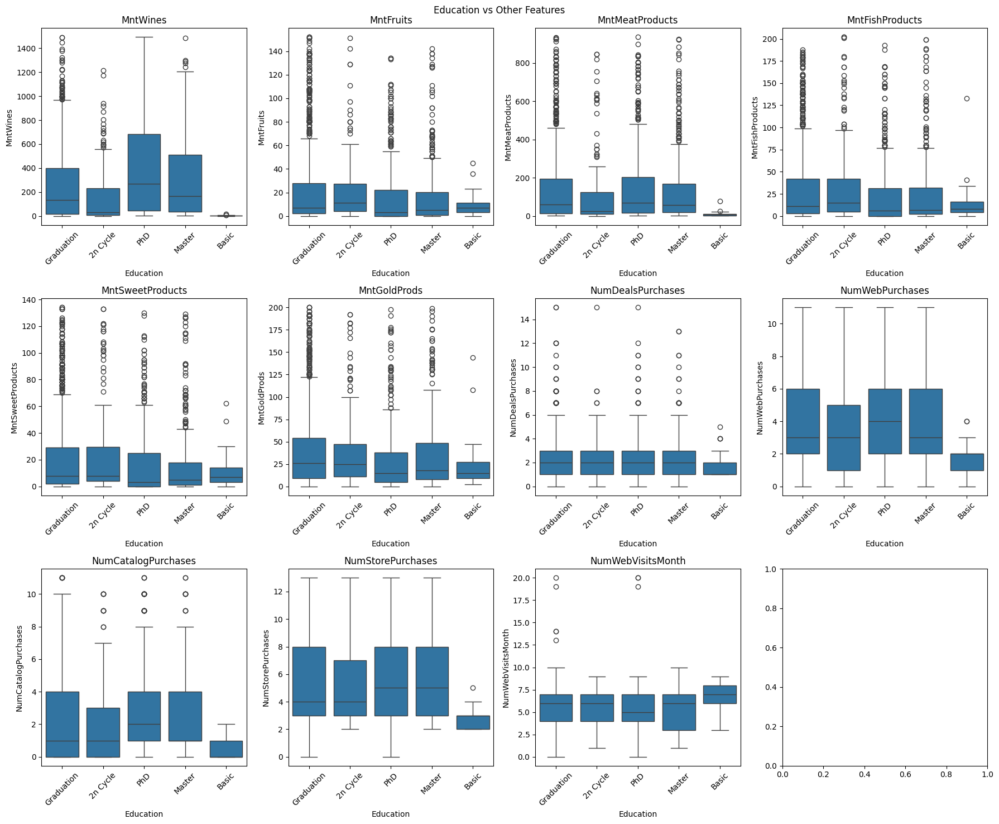

In [41]:
fig, axes = plt.subplots(3, 4, figsize=(18, 15))
for i, column in enumerate(mnt_columns[2:]):
    sns.boxplot(data=data_cleaned, x='Education', y=column, ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(f'{column}')
    education_labels = data_cleaned['Education'].unique()
    tick_positions = range(len(education_labels))
    axes[i // 4, i % 4].set_xticks(tick_positions)
    axes[i // 4, i % 4].set_xticklabels(labels=education_labels, rotation=45)

plt.suptitle('Education vs Other Features')
plt.tight_layout()
plt.show()

We can see some diferences in the distribution based on Education but it is important to remember that the number of people in each category is different.

### 6.5. What is age distribution of the customers and what response do they give?

In [42]:
from datetime import datetime

today = datetime.today()
data_cleaned['age'] = today.year - data_cleaned['Year_Birth']

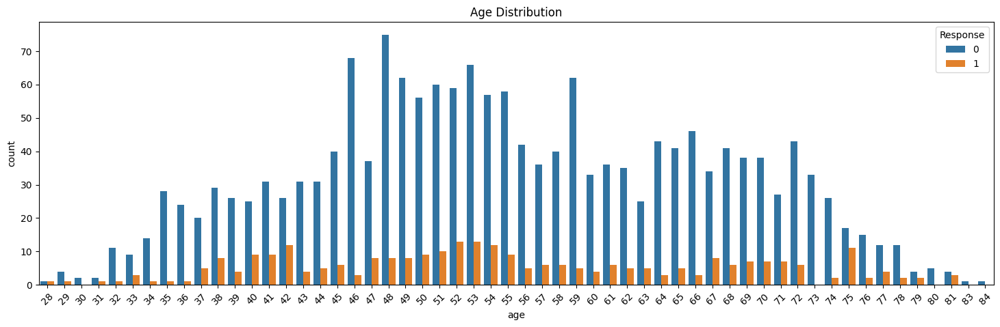

In [43]:
plt.figure(figsize=(18, 5))
sns.countplot(data=data_cleaned, x='age', hue='Response')
plt.xticks(rotation=45) 
plt.title('Age Distribution')
plt.show()

We can see different age groups and their response to the campaign.

The groups with more customers are:
* `48-55` with some peaks at `46` and `59`
* `64-72`

The groups with most positive responses are:
* `48-55`
* `75`
* `40-42`



### 6.6. How does the age affect the amount spent on different products?

In [44]:
age_filter = data_cleaned['age'].isin(range(46,75))
data_cleaned[age_filter]

,Id,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,month,year,day,age
1,1,1961,Graduation,Single,57091.0,0,0,6/15/2014,0,464,...,7,3,7,5,1,0,6,2014,15,63
2,10476,1958,Graduation,Married,67267.0,0,1,5/13/2014,0,134,...,3,2,5,2,0,0,5,2014,13,66
3,1386,1967,Graduation,Together,32474.0,1,1,11/5/2014,0,10,...,1,0,2,7,0,0,11,2014,5,57
6,4073,1954,2n Cycle,Married,63564.0,0,0,1/29/2014,0,769,...,10,10,7,6,1,0,1,2014,29,70
7,1991,1967,Graduation,Together,44931.0,0,1,1/18/2014,0,78,...,2,1,3,5,0,0,1,2014,18,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,9977,1973,Graduation,Divorced,78901.0,0,1,9/17/2013,99,321,...,9,3,5,4,0,0,9,2013,17,51
2235,10142,1976,PhD,Divorced,66476.0,0,1,7/3/2013,99,372,...,5,2,11,4,0,0,7,2013,3,48
2236,5263,1977,2n Cycle,Married,31056.0,1,0,1/22/2013,99,5,...,1,0,3,8,0,0,1,2013,22,47
2237,22,1976,Graduation,Divorced,46310.0,1,0,3/12/2012,99,185,...,6,1,5,8,0,0,3,2012,12,48


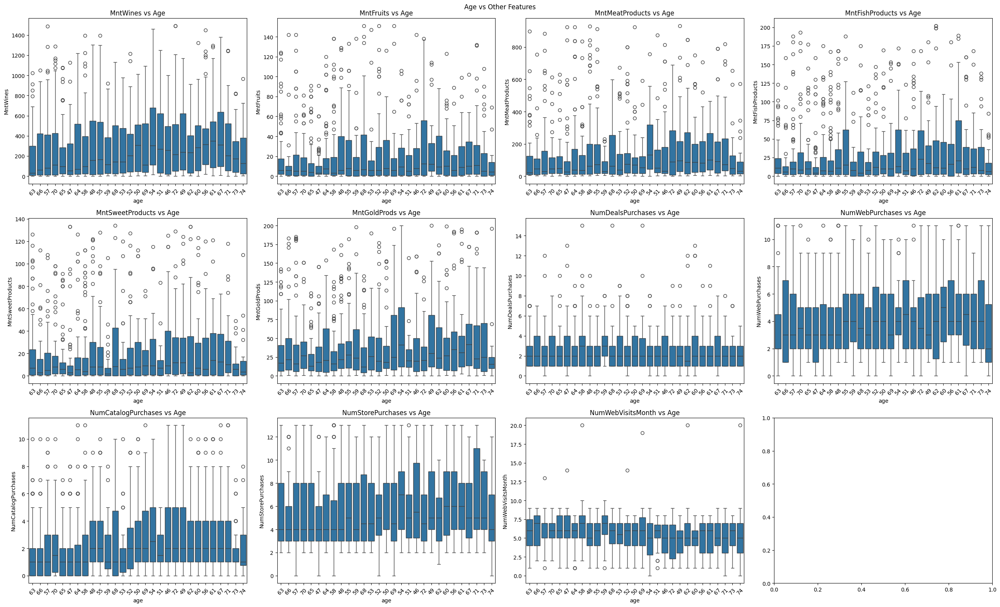

In [45]:
fig, axes = plt.subplots(3, 4, figsize=(26, 16))
for i, column in enumerate(mnt_columns[2:]):
    sns.boxplot(data=data_cleaned[age_filter], x='age', y=column, ax=axes[i//4, i%4])
    axes[i//4, i%4].set_title(f'{column} vs Age')

    age_labels = data_cleaned[age_filter]['age'].unique()
    tick_positions = range(len(age_labels))
    axes[i // 4, i % 4].set_xticks(tick_positions)
    axes[i // 4, i % 4].set_xticklabels(labels=age_labels, rotation=45)
plt.suptitle('Age vs Other Features')
plt.tight_layout()
plt.show()

We can see that people after 50 years of age tend more often to make more purchases from catalog compared to people below 50 years of age. Other variables seem to have some differences but not as significant as the `NumCatalogPurchases`.

### 6.7. Top 10 customers who spent the most on different products

In [46]:
data_cleaned['TotalMnt'] = data_cleaned['MntWines'] \
    + data_cleaned['MntFruits'] \
    + data_cleaned['MntMeatProducts'] \
    + data_cleaned['MntFishProducts'] \
    + data_cleaned['MntSweetProducts'] \
    + data_cleaned['MntGoldProds']

data_cleaned['TotalPurchases'] = data_cleaned['NumDealsPurchases'] \
    + data_cleaned['NumWebPurchases'] \
    + data_cleaned['NumCatalogPurchases'] \
    + data_cleaned['NumStorePurchases']

data_cleaned[['Id', 'TotalMnt']].sort_values(by='TotalMnt', ascending=False).head(10)

,Id,TotalMnt
1026,4580,2486
1864,4475,2440
376,10133,2349
1408,5386,2302
1409,6024,2302
696,2186,2257
1656,1173,2252
1293,737,2231
1054,6248,2217
927,7503,2209


### 6.8. Top 10 customers who made the most purchases

In [47]:
data_cleaned[['Id', 'TotalPurchases']].sort_values(by='TotalPurchases', ascending=False).head(10)

,Id,TotalPurchases
1718,238,39
41,7030,35
1396,3389,34
2195,5153,34
2196,4127,34
661,4299,34
1262,531,33
1997,8148,33
1193,2223,33
850,6658,32


## 6.9. Is our data balanced?

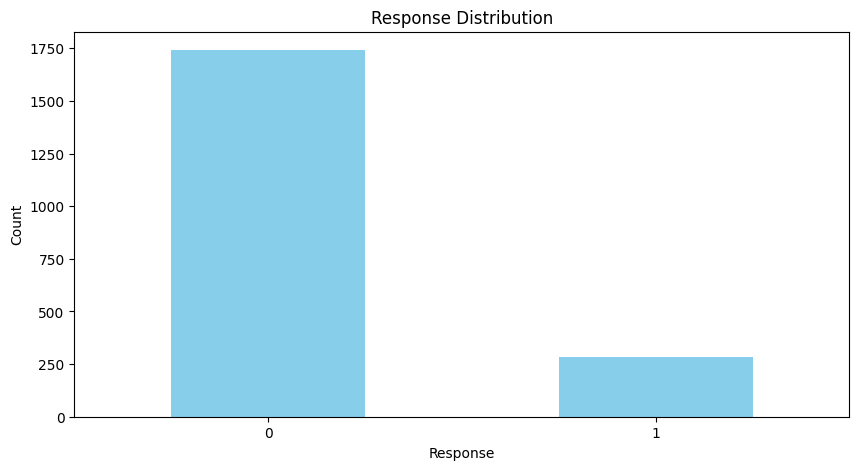

In [48]:
data_cleaned['Response'].value_counts().plot(kind='bar', figsize=(10, 5), title='Response Distribution', color='skyblue')
plt.xticks(rotation=0)
plt.ylabel('Count')
plt.xlabel('Response')
plt.show()